# Download Kvasir-SEG from Kaggle

In [1]:


import os
from pathlib import Path
import kagglehub

DATA_ROOT = Path(
    kagglehub.dataset_download("debeshjha1/kvasirseg")
)

print(f"Dataset downloaded to:\n{DATA_ROOT}")


Dataset downloaded to:
/kaggle/input/datasets/debeshjha1/kvasirseg


# Import Libraries

In [2]:
import importlib.util

print("Ultralytics installed:",
      importlib.util.find_spec("ultralytics") is not None)

Ultralytics installed: True


In [3]:
!pip install -q ultralytics

In [4]:
import os
import cv2
import csv
import shutil
import random
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from ultralytics import YOLO

import torch
print('PyTorch version :', torch.__version__)
print('GPU available   :', torch.cuda.is_available())
if torch.cuda.is_available():
  print('GPU name        :', torch.cuda.get_device_name(0))

PyTorch version : 2.10.0+cu128
GPU available   : True
GPU name        : Tesla T4


#Locate the dataset and Inspect dataset structure

In [5]:
image_dirs = [
    p for p in DATA_ROOT.rglob("images")
    if p.is_dir()
]

if not image_dirs:
    raise FileNotFoundError(
        f"Could not find an 'images' directory under:\n{DATA_ROOT}"
    )

IMAGE_DIR = image_dirs[0]
DATASET_DIR = IMAGE_DIR.parent

print(f"\nDataset directory : {DATASET_DIR}")
print(f"Images directory  : {IMAGE_DIR}")
print("\nDataset contents:")

for item in sorted(DATASET_DIR.iterdir()):
    item_type = "dir" if item.is_dir() else "file"
    print(f"  {item.name} ({item_type})")

#Basic validation


assert IMAGE_DIR.is_dir(), "Images directory was not found."

image_files = [
    p for p in IMAGE_DIR.iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png"}
]

print(f"\nNumber of images found: {len(image_files)}")

assert len(image_files) > 0, "No image files were found."

print("\nCell 1 completed successfully.")


Dataset directory : /kaggle/input/datasets/debeshjha1/kvasirseg/Kvasir-SEG/Kvasir-SEG
Images directory  : /kaggle/input/datasets/debeshjha1/kvasirseg/Kvasir-SEG/Kvasir-SEG/images

Dataset contents:
  1911.07069.pdf (file)
  annotated_images (dir)
  bbox (dir)
  images (dir)
  masks (dir)

Number of images found: 1000

Cell 1 completed successfully.


# Inspect bounding-box annotations

In [6]:
image_dirs = [
    p for p in DATA_ROOT.rglob("images")
    if p.is_dir()
]

if not image_dirs:
    raise FileNotFoundError(
        f"Could not find an 'images' directory under:\n{DATA_ROOT}"
    )

IMAGE_DIR = image_dirs[0]
DATASET_DIR = IMAGE_DIR.parent

print(f"\nDataset directory : {DATASET_DIR}")
print(f"Images directory  : {IMAGE_DIR}")


print("\nDataset contents:")

for item in sorted(DATASET_DIR.iterdir()):
    item_type = "dir" if item.is_dir() else "file"
    print(f"  {item.name} ({item_type})")

#Basic validation


assert IMAGE_DIR.is_dir(), "Images directory was not found."

image_files = [
    p for p in IMAGE_DIR.iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png"}
]

print(f"\nNumber of images found: {len(image_files)}")

assert len(image_files) > 0, "No image files were found."

print("\nCell 1 completed successfully.")



Dataset directory : /kaggle/input/datasets/debeshjha1/kvasirseg/Kvasir-SEG/Kvasir-SEG
Images directory  : /kaggle/input/datasets/debeshjha1/kvasirseg/Kvasir-SEG/Kvasir-SEG/images

Dataset contents:
  1911.07069.pdf (file)
  annotated_images (dir)
  bbox (dir)
  images (dir)
  masks (dir)

Number of images found: 1000

Cell 1 completed successfully.


# Visualize Ground-Truth Bounding Boxes

In [7]:
from pathlib import Path
import os

# Find the dataset automatically
DATA_ROOT = Path("/kaggle/input")

image_dirs = [
    p for p in DATA_ROOT.rglob("images")
    if p.is_dir()
]

if not image_dirs:
    raise FileNotFoundError(
        "Could not find an 'images' directory under /kaggle/input"
    )

IMAGE_DIR = image_dirs[0]
DATASET_DIR = IMAGE_DIR.parent

BBOX_DIR = DATASET_DIR / "bbox"
MASKS_DIR = DATASET_DIR / "masks"

print("DATASET_DIR :", DATASET_DIR)
print("IMAGE_DIR   :", IMAGE_DIR)
print("BBOX_DIR    :", BBOX_DIR)
print("MASKS_DIR   :", MASKS_DIR)

assert IMAGE_DIR.exists(), f"Images not found: {IMAGE_DIR}"
assert BBOX_DIR.exists(), f"BBox directory not found: {BBOX_DIR}"
assert MASKS_DIR.exists(), f"Masks directory not found: {MASKS_DIR}"

image_files = sorted([
    p for p in IMAGE_DIR.iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png"}
])

print("\nImages:", len(image_files))
print("BBox files:", len(list(BBOX_DIR.glob("*.csv"))))
print("Mask files:", len([
    p for p in MASKS_DIR.iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png"}
]))

print("\nDataset paths are ready.")

DATASET_DIR : /kaggle/input/datasets/debeshjha1/kvasirseg/Kvasir-SEG/Kvasir-SEG
IMAGE_DIR   : /kaggle/input/datasets/debeshjha1/kvasirseg/Kvasir-SEG/Kvasir-SEG/images
BBOX_DIR    : /kaggle/input/datasets/debeshjha1/kvasirseg/Kvasir-SEG/Kvasir-SEG/bbox
MASKS_DIR   : /kaggle/input/datasets/debeshjha1/kvasirseg/Kvasir-SEG/Kvasir-SEG/masks

Images: 1000
BBox files: 1000
Mask files: 1000

Dataset paths are ready.


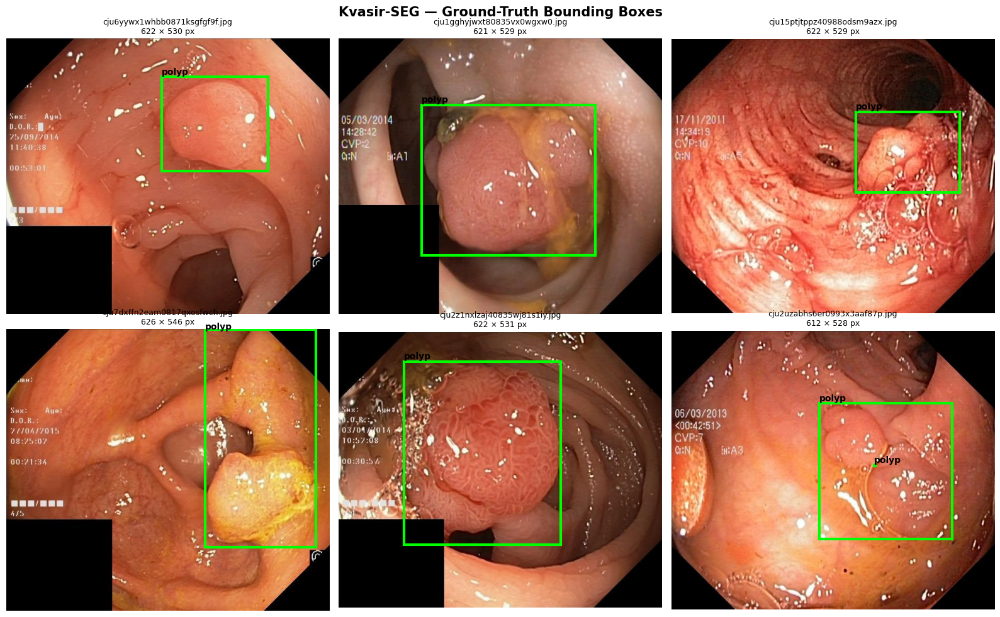

In [8]:
import random
import csv
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

random.seed(42)
sample_images = random.sample(image_files, 6)
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle(
    "Kvasir-SEG — Ground-Truth Bounding Boxes",
    fontsize=15,
    fontweight="bold"
)
axes = axes.flatten()


for i, image_path in enumerate(sample_images):

    # Read image
    img = cv2.imread(str(image_path))
    if img is None:
        raise ValueError(f"Could not read image: {image_path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    height, width = img.shape[:2]

    csv_path = BBOX_DIR / f"{image_path.stem}.csv"
    if not csv_path.exists():
        raise FileNotFoundError(
            f"Bounding-box annotation not found:\n{csv_path}"
        )

    # Read CSV
    with open(csv_path, "r") as f:
        reader = csv.DictReader(f)
        rows = list(reader)

    if len(rows) == 0:
        raise ValueError(f"No bounding box found in {csv_path}")

    # Draw every bounding box in the annotation file
    for row in rows:

        xmin = float(row["xmin"])
        ymin = float(row["ymin"])
        xmax = float(row["xmax"])
        ymax = float(row["ymax"])
        assert 0 <= xmin <= width, (f"Invalid xmin in {csv_path.name}")
        assert 0 <= xmax <= width, (f"Invalid xmax in {csv_path.name}")
        assert 0 <= ymin <= height, (f"Invalid ymin in {csv_path.name}")
        assert 0 <= ymax <= height, (f"Invalid ymax in {csv_path.name}")
        assert xmax > xmin, (f"Invalid box width in {csv_path.name}")
        assert ymax > ymin, (f"Invalid box height in {csv_path.name}")


        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=3,
            edgecolor="lime",
            facecolor="none"
        )

        axes[i].add_patch(rect)

        # Class label
        axes[i].text(
            xmin,
            max(0, ymin - 5),
            row["class_name"],
            fontsize=10,
            fontweight="bold"
        )

    # Display image
    axes[i].imshow(img)

    axes[i].set_title(
        f"{image_path.name}\n{width} × {height} px",
        fontsize=9
    )

    axes[i].axis("off")

plt.tight_layout()
plt.show()

# Convert Kvasir CSV → YOLO Format
> Kvasir CSV: `class_name, xmin, ymin, xmax, ymax` (absolute pixels)  
> YOLO txt: `class cx cy w h` (normalized 0-1, center-based)

In [9]:
def read_bbox_csv(csv_path, img_w, img_h):
    """
    Read Kvasir-SEG bounding-box CSV and convert
    absolute pixel coordinates to YOLO format.

    Kvasir CSV:
        class_name, xmin, ymin, xmax, ymax

    YOLO format:
        class_id, center_x, center_y, width, height

    YOLO coordinates are normalized to [0, 1].
    """

    yolo_annotations = []

    with open(csv_path, "r") as f:
        reader = csv.DictReader(f)
        rows = list(reader)

    if not rows:
        raise ValueError(f"No annotations found in: {csv_path}")

    for row in rows:
        # Read bounding box
        x1 = float(row["xmin"])
        y1 = float(row["ymin"])
        x2 = float(row["xmax"])
        y2 = float(row["ymax"])

        # Validate pixel coordinates
        if not (0 <= x1 < x2 <= img_w):
            raise ValueError(
                f"Invalid x coordinates in {csv_path}: "
                f"{x1}, {x2} for image width {img_w}"
            )

        if not (0 <= y1 < y2 <= img_h):
            raise ValueError(
                f"Invalid y coordinates in {csv_path}: "
                f"{y1}, {y2} for image height {img_h}"
            )
        box_w = x2 - x1
        box_h = y2 - y1
        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2
        center_x /= img_w
        center_y /= img_h
        box_w /= img_w
        box_h /= img_h
        values = [center_x, center_y, box_w, box_h]

        if not all(0 <= value <= 1 for value in values):
            raise ValueError(
                f"Normalized YOLO coordinates outside [0,1] "
                f"in {csv_path}: {values}"
            )

        class_id = 0  # polyp

        yolo_line = (
            f"{class_id} "
            f"{center_x:.6f} "
            f"{center_y:.6f} "
            f"{box_w:.6f} "
            f"{box_h:.6f}"
        )

        yolo_annotations.append(yolo_line)

    return yolo_annotations

In [10]:

test_image = image_files[0]
test_img = cv2.imread(str(test_image))
if test_img is None:
    raise ValueError(f"Could not read image: {test_image}")

img_h, img_w = test_img.shape[:2]
test_csv = BBOX_DIR / f"{test_image.stem}.csv"
yolo_lines = read_bbox_csv(
    test_csv,
    img_w,
    img_h
)

print("Image       :", test_image.name)
print("Image size  :", f"{img_w} × {img_h}")
print("CSV         :", test_csv.name)
print("\nYOLO annotation:")

for line in yolo_lines:
    print(line)
print("\nFormat:")
print("class_id center_x center_y width height")
print("class 0 = polyp")

Image       : cju0qkwl35piu0993l0dewei2.jpg
Image size  : 622 × 529
CSV         : cju0qkwl35piu0993l0dewei2.csv

YOLO annotation:
0 0.376206 0.324197 0.630225 0.629490

Format:
class_id center_x center_y width height
class 0 = polyp


# Create Train / Validation / Test Splits

In [11]:
from sklearn.model_selection import train_test_split

all_keys = sorted([
    p.stem
    for p in Path(IMAGE_DIR).iterdir()
    if p.suffix.lower() == ".jpg"
])

print(f"Total images: {len(all_keys)}")

assert len(all_keys) == 1000, (
    f"Expected 1000 images, found {len(all_keys)}"
)

train_keys, temp_keys = train_test_split(
    all_keys,
    test_size=0.30,
    random_state=42
)

val_keys, test_keys = train_test_split(
    temp_keys,
    test_size=0.50,
    random_state=42
)

print("\nDataset split:")
print(f"Train : {len(train_keys)} images")
print(f"Val   : {len(val_keys)} images")
print(f"Test  : {len(test_keys)} images")

assert len(train_keys) == 700
assert len(val_keys) == 150
assert len(test_keys) == 150

train_set = set(train_keys)
val_set = set(val_keys)
test_set = set(test_keys)

assert train_set.isdisjoint(val_set)
assert train_set.isdisjoint(test_set)
assert val_set.isdisjoint(test_set)

print("\n✓ No image overlap between splits.")
print("✓ Train/Val/Test split created successfully.")

Total images: 1000

Dataset split:
Train : 700 images
Val   : 150 images
Test  : 150 images

✓ No image overlap between splits.
✓ Train/Val/Test split created successfully.


# Clean and Rebuild YOLO Dataset

In [12]:
from pathlib import Path
import shutil
import cv2

BASE = Path("/content/dataset")
if BASE.exists():
    print(f"Removing previous dataset: {BASE}")
    shutil.rmtree(BASE)

for split in ["train", "val", "test"]:

    (BASE / "images" / split).mkdir(
        parents=True,
        exist_ok=True
    )

    (BASE / "labels" / split).mkdir(
        parents=True,
        exist_ok=True
    )

print("Clean YOLO directory structure created.")

def build_split(keys, split_name):

    image_output = BASE / "images" / split_name
    label_output = BASE / "labels" / split_name

    for key in keys:

        img_path = Path(IMAGE_DIR) / f"{key}.jpg"
        csv_path = Path(BBOX_DIR) / f"{key}.csv"
        if not img_path.exists():
            raise FileNotFoundError(
                f"Image not found:\n{img_path}"
            )

        if not csv_path.exists():
            raise FileNotFoundError(
                f"Bounding-box CSV not found:\n{csv_path}"
            )

        img = cv2.imread(str(img_path))
        if img is None:
            raise ValueError(
                f"Could not read image:\n{img_path}"
            )

        height, width = img.shape[:2]
        yolo_lines = read_bbox_csv(
            csv_path,
            width,
            height
        )
        shutil.copy2(
            img_path,
            image_output / f"{key}.jpg"
        )

        label_path = (
            label_output / f"{key}.txt"
        )

        with open(label_path, "w") as f:

            for line in yolo_lines:
                f.write(line + "\n")


print("\nBuilding clean YOLO dataset...")
build_split(train_keys, "train")
build_split(val_keys, "val")
build_split(test_keys, "test")

print("\n" + "=" * 65)
print("FINAL YOLO DATASET")
print("=" * 65)

expected_counts = {
    "train": len(train_keys),
    "val": len(val_keys),
    "test": len(test_keys)
}

for split in ["train", "val", "test"]:

    image_count = len(
        list(
            (BASE / "images" / split).glob("*.jpg")
        )
    )

    label_count = len(
        list(
            (BASE / "labels" / split).glob("*.txt")
        )
    )

    expected = expected_counts[split]

    print(
        f"{split:5s} → "
        f"images: {image_count:3d} | "
        f"labels: {label_count:3d} | "
        f"expected: {expected:3d}"
    )

    assert image_count == expected, (
        f"{split}: expected {expected}, "
        f"found {image_count}"
    )

    assert label_count == expected, (
        f"{split}: expected {expected}, "
        f"found {label_count}"
    )


print("\n" + "=" * 65)
print("✓ YOLO DATASET REBUILT SUCCESSFULLY")
print("=" * 65)

Removing previous dataset: /content/dataset
Clean YOLO directory structure created.

Building clean YOLO dataset...

FINAL YOLO DATASET
train → images: 700 | labels: 700 | expected: 700
val   → images: 150 | labels: 150 | expected: 150
test  → images: 150 | labels: 150 | expected: 150

✓ YOLO DATASET REBUILT SUCCESSFULLY


# Create YOLO Dataset Configuration

In [13]:
import yaml

# Absolute path to our generated YOLO dataset
DATASET_PATH = BASE.resolve()

dataset_yaml = {
    "path": str(DATASET_PATH),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "nc": 1,
    "names": {
        0: "polyp"
    }
}

yaml_path = Path("kvasir_detection.yaml")

with open(yaml_path, "w") as f:
    yaml.dump(
        dataset_yaml,
        f,
        sort_keys=False,
        default_flow_style=False
    )

print("Dataset YAML:")
print("-" * 50)

with open(yaml_path, "r") as f:
    print(f.read())

print("-" * 50)
print(f"YAML path: {yaml_path.resolve()}")
print("dataset.yaml ready.")

Dataset YAML:
--------------------------------------------------
path: /content/dataset
train: images/train
val: images/val
test: images/test
nc: 1
names:
  0: polyp

--------------------------------------------------
YAML path: /kaggle/working/kvasir_detection.yaml
dataset.yaml ready.


# Experimental Configuration

In [14]:
MODELS = {
    "YOLOv8n": "yolov8n.pt",
    "YOLO12m": "yolo12m.pt",
    "YOLO26m": "yolo26m.pt",
}

IMG_SIZE = 640
EPOCHS = 100
BATCH_SIZE = 8
PATIENCE = 25

LR0 = None
LRF = None

CONF_THRESH = 0.25
IOU_THRESH = 0.45

SEED = 42

print("=" * 60)
print("YOLO MODEL COMPARISON EXPERIMENT")
print("=" * 60)

print("\nModels:")
for i, (name, weights) in enumerate(MODELS.items(), start=1):
    print(f"  {i}. {name:8s} → {weights}")

print("\nCommon training configuration:")
print(f"  Image size     : {IMG_SIZE} × {IMG_SIZE}")
print(f"  Epochs         : {EPOCHS}")
print(f"  Batch size     : {BATCH_SIZE}")
print(f"  Learning rate  : Ultralytics defaults")
print(f"  Early stopping : {PATIENCE} epochs")
print(f"  Random seed    : {SEED}")

print("\nEvaluation configuration:")
print(f"  Confidence threshold : {CONF_THRESH}")
print(f"  IoU threshold        : {IOU_THRESH}")

print("\nTotal models:", len(MODELS))

YOLO MODEL COMPARISON EXPERIMENT

Models:
  1. YOLOv8n  → yolov8n.pt
  2. YOLO12m  → yolo12m.pt
  3. YOLO26m  → yolo26m.pt

Common training configuration:
  Image size     : 640 × 640
  Epochs         : 100
  Batch size     : 8
  Learning rate  : Ultralytics defaults
  Early stopping : 25 epochs
  Random seed    : 42

Evaluation configuration:
  Confidence threshold : 0.25
  IoU threshold        : 0.45

Total models: 3


# Verify YOLO Models

In [15]:
from ultralytics import YOLO
import gc
import torch

model_info = {}

print("=" * 70)
print("VERIFYING YOLO MODEL CHECKPOINTS")
print("=" * 70)

for model_name, weights in MODELS.items():

    print(f"\nLoading {model_name} ({weights})...")

    try:
        model = YOLO(weights)
        total_params = sum(
            p.numel()
            for p in model.model.parameters()
        )
        model_info[model_name] = {
            "weights": weights,
            "parameters": total_params
        }

        print("  ✓ Loaded successfully")
        print(f"  Parameters: {total_params:,}")
        del model
        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    except Exception as e:

        print(f"  ✗ Failed to load {weights}")
        print(f"  Error: {e}")

print("\n" + "=" * 70)
print("MODEL SUMMARY")
print("=" * 70)

for name, info in model_info.items():

    print(
        f"{name:9s} | "
        f"{info['weights']:12s} | "
        f"{info['parameters']:,} parameters"
    )

print(
    f"\nSuccessfully loaded: "
    f"{len(model_info)}/{len(MODELS)} models"
)

# ------------------------------------------------------------
# Final validation
# ------------------------------------------------------------

assert len(model_info) == len(MODELS), (
    "One or more YOLO checkpoints could not be loaded. "
    "Fix the checkpoint names before training."
)

print("\n✓ All three models are available for training.")

VERIFYING YOLO MODEL CHECKPOINTS

Loading YOLOv8n (yolov8n.pt)...
  ✓ Loaded successfully
  Parameters: 3,157,200

Loading YOLO12m (yolo12m.pt)...
  ✓ Loaded successfully
  Parameters: 20,201,216

Loading YOLO26m (yolo26m.pt)...
  ✓ Loaded successfully
  Parameters: 21,896,248

MODEL SUMMARY
YOLOv8n   | yolov8n.pt   | 3,157,200 parameters
YOLO12m   | yolo12m.pt   | 20,201,216 parameters
YOLO26m   | yolo26m.pt   | 21,896,248 parameters

Successfully loaded: 3/3 models

✓ All three models are available for training.


# Train


In [16]:
from ultralytics import YOLO
import gc
import torch


PROJECT_NAME = "ENDOX_runs"

# Store information about each experiment
training_results = {}

for model_name, weights in MODELS.items():

    print("\n" + "=" * 70)
    print(f"STARTING TRAINING: {model_name}")
    print(f"Checkpoint: {weights}")
    print("=" * 70)


    model = YOLO(weights)
    total_params = sum(
        p.numel()
        for p in model.model.parameters()
    )

    print(f"Parameters: {total_params:,}")

    results = model.train(

        # Dataset
        data=str(yaml_path),

        # Common training settings
        epochs=EPOCHS,
        imgsz=IMG_SIZE,
        batch=BATCH_SIZE,
        patience=PATIENCE,

        # Reproducibility
        seed=SEED,

        # Use standard augmentation
        augment=True,

        # Save results
        save=True,

        # Separate folder for each model
        project=PROJECT_NAME,
        name=model_name,

        verbose=True
    )

    training_results[model_name] = {
        "weights": weights,
        "parameters": total_params,
        "results": results,
        "best_model": (
            f"{PROJECT_NAME}/{model_name}/weights/best.pt"
        )
    }

    print("\nTraining complete!")
    print(
        f"Best model: "
        f"{PROJECT_NAME}/{model_name}/weights/best.pt"
    )
    del model
    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print("\n" + "=" * 70)
print("ALL TRAINING COMPLETED")
print("=" * 70)

for model_name, info in training_results.items():

    print(
        f"{model_name:9s} → "
        f"{info['best_model']}"
    )


STARTING TRAINING: YOLOv8n
Checkpoint: yolov8n.pt
Parameters: 3,157,200
Ultralytics 8.4.129 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=kvasir_detection.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mo

# Plot Training Curves

LOADING SELECTED YOLO EXPERIMENT RESULTS

YOLOv8n
Run         : YOLOv8n-3
results.csv : ✓
best.pt     : ✓
✓ 100 epochs loaded

YOLO12m
Run         : YOLO12m-2
results.csv : ✓
best.pt     : ✓
✓ 100 epochs loaded

YOLO26m
Run         : YOLO26m-2
results.csv : ✓
best.pt     : ✓
✓ 100 epochs loaded

AVAILABLE METRICS

YOLOv8n
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']

YOLO12m
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']

YOLO26m
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/l1_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cl

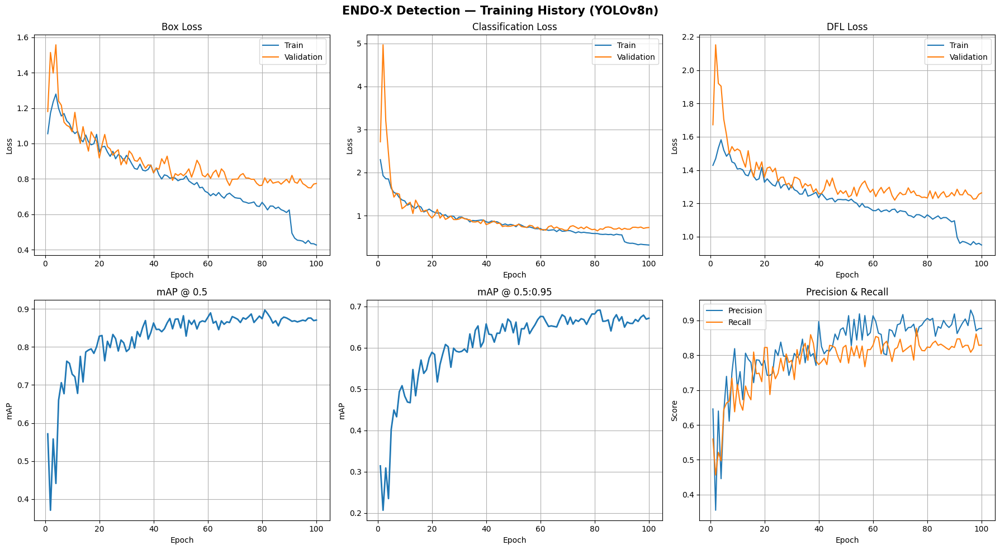

✓ Saved: /kaggle/working/runs/detect/ENDOX_runs/YOLOv8n_training_curves.png


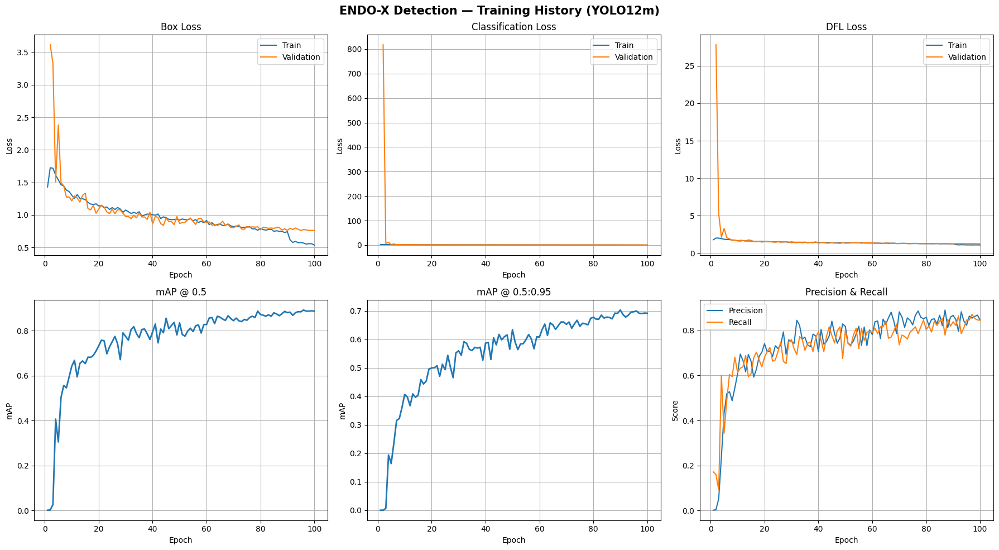

✓ Saved: /kaggle/working/runs/detect/ENDOX_runs/YOLO12m_training_curves.png


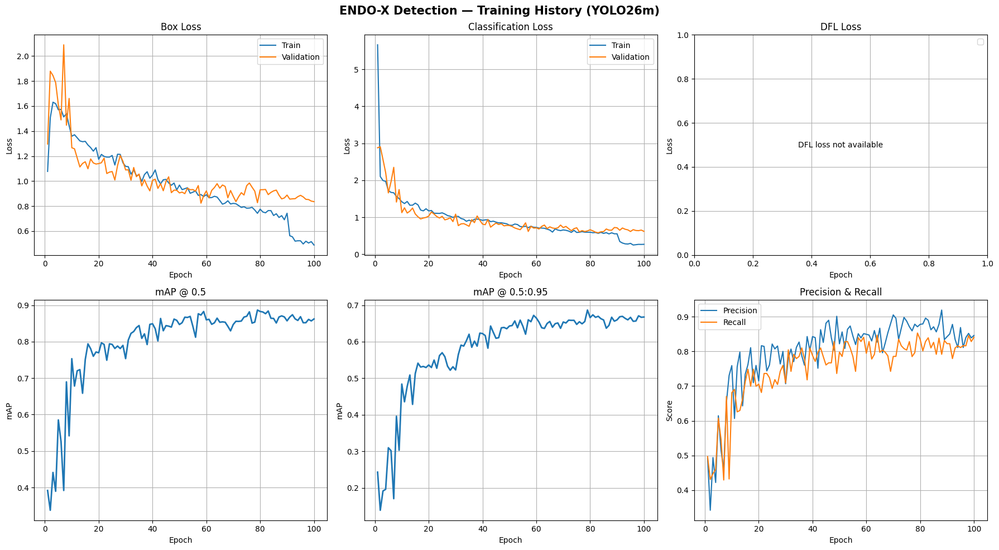

✓ Saved: /kaggle/working/runs/detect/ENDOX_runs/YOLO26m_training_curves.png

TRAINING CURVES COMPLETED


In [26]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

RUNS_DIR = Path("/kaggle/working/runs/detect/ENDOX_runs")

SELECTED_RUNS = {
    "YOLOv8n": "YOLOv8n-3",
    "YOLO12m": "YOLO12m-2",
    "YOLO26m": "YOLO26m-2"
}

model_dfs = {}

print("=" * 70)
print("LOADING SELECTED YOLO EXPERIMENT RESULTS")
print("=" * 70)

for model_name, run_name in SELECTED_RUNS.items():

    run_dir = RUNS_DIR / run_name
    results_path = run_dir / "results.csv"
    weights_path = run_dir / "weights" / "best.pt"

    print(f"\n{model_name}")
    print(f"Run         : {run_name}")
    print(f"results.csv : {'✓' if results_path.exists() else '✗'}")
    print(f"best.pt     : {'✓' if weights_path.exists() else '✗'}")

    if not results_path.exists():
        print(f"⚠ Skipping {model_name}: results.csv not found")
        continue

    df = pd.read_csv(results_path)
    df.columns = df.columns.str.strip()

    model_dfs[model_name] = df

    print(f"✓ {len(df)} epochs loaded")

print("\n" + "=" * 70)
print("AVAILABLE METRICS")
print("=" * 70)

for model_name, df in model_dfs.items():
    print(f"\n{model_name}")
    print(list(df.columns))


for model_name, df in model_dfs.items():

    epochs = df["epoch"]

    fig, axes = plt.subplots(
        2,
        3,
        figsize=(18, 10)
    )

    fig.suptitle(
        f"ENDO-X Detection — Training History ({model_name})",
        fontsize=15,
        fontweight="bold"
    )

    if "train/box_loss" in df.columns:
        axes[0, 0].plot(
            epochs,
            df["train/box_loss"],
            label="Train"
        )

    if "val/box_loss" in df.columns:
        axes[0, 0].plot(
            epochs,
            df["val/box_loss"],
            label="Validation"
        )

    axes[0, 0].set_title("Box Loss")
    axes[0, 0].set_xlabel("Epoch")
    axes[0, 0].set_ylabel("Loss")
    axes[0, 0].legend()
    axes[0, 0].grid(True)


    if "train/cls_loss" in df.columns:
        axes[0, 1].plot(
            epochs,
            df["train/cls_loss"],
            label="Train"
        )

    if "val/cls_loss" in df.columns:
        axes[0, 1].plot(
            epochs,
            df["val/cls_loss"],
            label="Validation"
        )

    axes[0, 1].set_title("Classification Loss")
    axes[0, 1].set_xlabel("Epoch")
    axes[0, 1].set_ylabel("Loss")
    axes[0, 1].legend()
    axes[0, 1].grid(True)


    if "train/dfl_loss" in df.columns:
        axes[0, 2].plot(
            epochs,
            df["train/dfl_loss"],
            label="Train"
        )

    if "val/dfl_loss" in df.columns:
        axes[0, 2].plot(
            epochs,
            df["val/dfl_loss"],
            label="Validation"
        )

    if (
        "train/dfl_loss" not in df.columns
        and "val/dfl_loss" not in df.columns
    ):
        axes[0, 2].text(
            0.5,
            0.5,
            "DFL loss not available",
            ha="center",
            va="center",
            transform=axes[0, 2].transAxes
        )

    axes[0, 2].set_title("DFL Loss")
    axes[0, 2].set_xlabel("Epoch")
    axes[0, 2].set_ylabel("Loss")
    axes[0, 2].legend()
    axes[0, 2].grid(True)


    if "metrics/mAP50(B)" in df.columns:
        axes[1, 0].plot(
            epochs,
            df["metrics/mAP50(B)"],
            linewidth=2
        )

    axes[1, 0].set_title("mAP @ 0.5")
    axes[1, 0].set_xlabel("Epoch")
    axes[1, 0].set_ylabel("mAP")
    axes[1, 0].grid(True)


    if "metrics/mAP50-95(B)" in df.columns:
        axes[1, 1].plot(
            epochs,
            df["metrics/mAP50-95(B)"],
            linewidth=2
        )

    axes[1, 1].set_title("mAP @ 0.5:0.95")
    axes[1, 1].set_xlabel("Epoch")
    axes[1, 1].set_ylabel("mAP")
    axes[1, 1].grid(True)


    if "metrics/precision(B)" in df.columns:
        axes[1, 2].plot(
            epochs,
            df["metrics/precision(B)"],
            label="Precision"
        )

    if "metrics/recall(B)" in df.columns:
        axes[1, 2].plot(
            epochs,
            df["metrics/recall(B)"],
            label="Recall"
        )

    axes[1, 2].set_title("Precision & Recall")
    axes[1, 2].set_xlabel("Epoch")
    axes[1, 2].set_ylabel("Score")
    axes[1, 2].legend()
    axes[1, 2].grid(True)

    plt.tight_layout()

    output_path = RUNS_DIR / f"{model_name}_training_curves.png"

    plt.savefig(
        output_path,
        dpi=150,
        bbox_inches="tight"
    )

    plt.show()

    print(f"✓ Saved: {output_path}")

print("\n" + "=" * 70)
print("TRAINING CURVES COMPLETED")
print("=" * 70)

# Evaluate on Test Set

In [28]:
from ultralytics import YOLO
from pathlib import Path
import pandas as pd
import gc
import torch

RUNS_DIR = Path("/kaggle/working/runs/detect/ENDOX_runs")

SELECTED_RUNS = {
    "YOLOv8n": "YOLOv8n-3",
    "YOLO12m": "YOLO12m-2",
    "YOLO26m": "YOLO26m-2"
}

evaluation_results = []

print("=" * 70)
print("EVALUATING TRAINED MODELS ON THE TEST SET")
print("=" * 70)

for model_name, run_name in SELECTED_RUNS.items():

    best_path = (
        RUNS_DIR
        / run_name
        / "weights"
        / "best.pt"
    )

    print("\n" + "=" * 70)
    print(f"Model : {model_name}")
    print(f"Run   : {run_name}")
    print(f"Weights: {best_path}")
    print("=" * 70)

    if not best_path.exists():
        print(f"WARNING: best.pt not found")
        print("Skipping...")
        continue

    model = YOLO(str(best_path))

    metrics = model.val(
        data=str(yaml_path),
        split="test",
        imgsz=IMG_SIZE,
        conf=CONF_THRESH,
        iou=IOU_THRESH,
        verbose=True
    )

    map50 = float(metrics.box.map50)
    map5095 = float(metrics.box.map)
    precision = float(metrics.box.mp)
    recall = float(metrics.box.mr)

    if precision + recall > 0:
        f1 = (
            2 * precision * recall
            / (precision + recall)
        )
    else:
        f1 = 0.0

    evaluation_results.append({
        "Model": model_name,
        "Run": run_name,
        "mAP50": map50,
        "mAP50-95": map5095,
        "Precision": precision,
        "Recall": recall,
        "F1": f1
    })

    print("\n--- TEST RESULTS ---")

    print(
        f"mAP50       : {map50:.4f} "
        f"({map50 * 100:.2f}%)"
    )

    print(
        f"mAP50-95    : {map5095:.4f} "
        f"({map5095 * 100:.2f}%)"
    )

    print(f"Precision   : {precision:.4f}")
    print(f"Recall      : {recall:.4f}")
    print(f"F1          : {f1:.4f}")

    del model
    del metrics

    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()


results_df = pd.DataFrame(evaluation_results)

print("\n" + "=" * 70)
print("FINAL TEST-SET MODEL COMPARISON")
print("=" * 70)

if len(results_df) == 0:

    print("No trained models were found.")

else:

    results_df = results_df.sort_values(
        "mAP50-95",
        ascending=False
    ).reset_index(drop=True)

    results_df.insert(
        0,
        "Rank",
        range(1, len(results_df) + 1)
    )

    display(
        results_df.style.format({
            "mAP50": "{:.4f}",
            "mAP50-95": "{:.4f}",
            "Precision": "{:.4f}",
            "Recall": "{:.4f}",
            "F1": "{:.4f}"
        })
    )

    best_model_name = results_df.iloc[0]["Model"]
    best_run_name = results_df.iloc[0]["Run"]

    print("\n" + "=" * 70)
    print("BEST MODEL")
    print("=" * 70)

    print(f"Model       : {best_model_name}")
    print(f"Run         : {best_run_name}")
    print(
        f"mAP50-95    : "
        f"{results_df.iloc[0]['mAP50-95']:.4f}"
    )
    print(
        f"mAP50       : "
        f"{results_df.iloc[0]['mAP50']:.4f}"
    )
    print(
        f"Precision   : "
        f"{results_df.iloc[0]['Precision']:.4f}"
    )
    print(
        f"Recall      : "
        f"{results_df.iloc[0]['Recall']:.4f}"
    )
    print(
        f"F1          : "
        f"{results_df.iloc[0]['F1']:.4f}"
    )

    best_weights = (
        RUNS_DIR
        / best_run_name
        / "weights"
        / "best.pt"
    )

    print(f"\nBest weights:")
    print(best_weights)

    results_csv = RUNS_DIR / "test_set_model_comparison.csv"

    results_df.to_csv(
        results_csv,
        index=False
    )

    print(f"\nSaved comparison CSV:")
    print(results_csv)    # --------------------------------------------------------
    # Save CSV
    # --------------------------------------------------------

    comparison_path = (
        RUNS_DIR / "model_comparison_test.csv"
    )

    results_df.to_csv(
        comparison_path,
        index=False
    )

    print(
        f"\nComparison saved to:\n"
        f"{comparison_path}"
    )

EVALUATING TRAINED MODELS ON THE TEST SET

Model : YOLOv8n
Run   : YOLOv8n-3
Weights: /kaggle/working/runs/detect/ENDOX_runs/YOLOv8n-3/weights/best.pt
Ultralytics 8.4.129 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1688.5±511.4 MB/s, size: 58.9 KB)
val: Scanning /content/dataset/labels/test... 150 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 150/150 1.3Kit/s 0.1s<0.1s
val: New cache created: /content/dataset/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 4.7it/s 2.1s.1s
                   all        150        155       0.92      0.895       0.88      0.636
Speed: 2.3ms preprocess, 4.2ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

--- TEST RESULTS ---
mAP50       : 0.8799 (87.99%)
mAP50-95   

,Rank,Model,Run,mAP50,mAP50-95,Precision,Recall,F1
0,1,YOLO12m,YOLO12m-2,0.8780,0.6764,0.8783,0.9032,0.8906
1,2,YOLO26m,YOLO26m-2,0.8528,0.6557,0.9002,0.8516,0.8752
2,3,YOLOv8n,YOLOv8n-3,0.8799,0.6362,0.9204,0.8954,0.9078



BEST MODEL
Model       : YOLO12m
Run         : YOLO12m-2
mAP50-95    : 0.6764
mAP50       : 0.8780
Precision   : 0.8783
Recall      : 0.9032
F1          : 0.8906

Best weights:
/kaggle/working/runs/detect/ENDOX_runs/YOLO12m-2/weights/best.pt

Saved comparison CSV:
/kaggle/working/runs/detect/ENDOX_runs/test_set_model_comparison.csv

Comparison saved to:
/kaggle/working/runs/detect/ENDOX_runs/model_comparison_test.csv


# Visualize Predictions on Test Images


Generating predictions for YOLOv8n...
Run: YOLOv8n-3


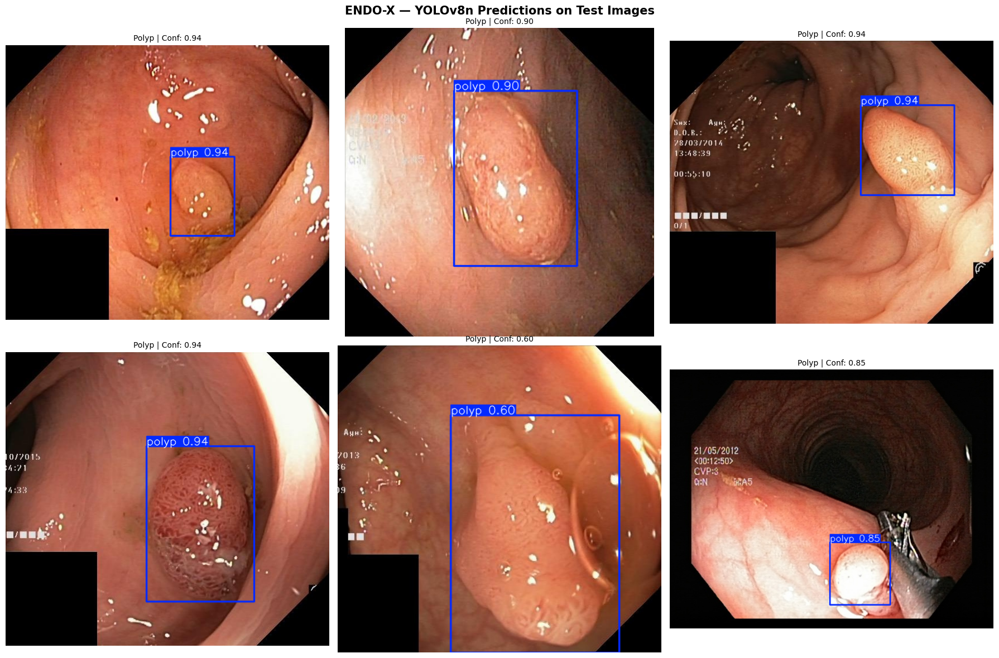

Saved: /kaggle/working/runs/detect/ENDOX_runs/YOLOv8n_test_predictions.png

Generating predictions for YOLO12m...
Run: YOLO12m-2


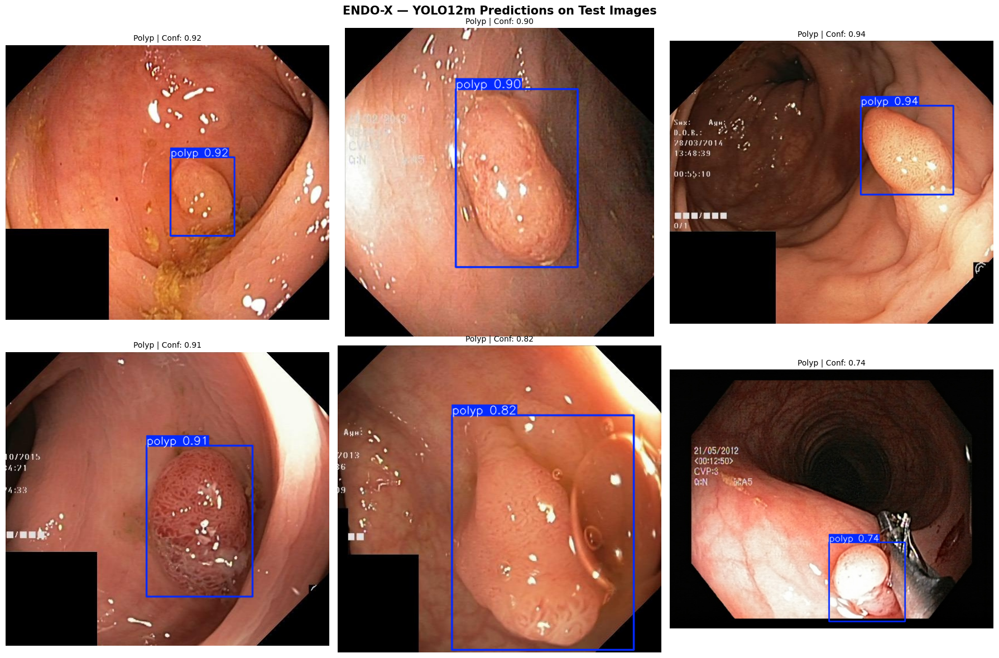

Saved: /kaggle/working/runs/detect/ENDOX_runs/YOLO12m_test_predictions.png

Generating predictions for YOLO26m...
Run: YOLO26m-2


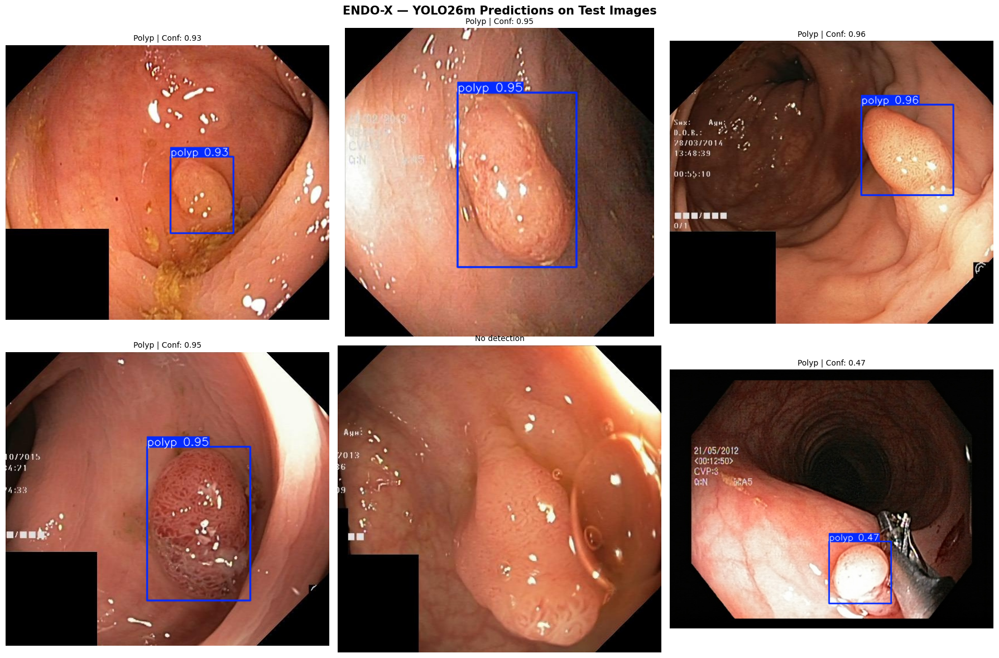

Saved: /kaggle/working/runs/detect/ENDOX_runs/YOLO26m_test_predictions.png


In [29]:
from ultralytics import YOLO
from pathlib import Path
import os
import random
import cv2
import torch
import matplotlib.pyplot as plt

RUNS_DIR = Path("/kaggle/working/runs/detect/ENDOX_runs")

SELECTED_RUNS = {
    "YOLOv8n": "YOLOv8n-3",
    "YOLO12m": "YOLO12m-2",
    "YOLO26m": "YOLO26m-2"
}

test_img_dir = Path(BASE) / "images" / "test"

test_files = [
    f for f in os.listdir(test_img_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

random.seed(42)

test_images = random.sample(
    test_files,
    min(6, len(test_files))
)

for model_name, run_name in SELECTED_RUNS.items():

    best_path = (
        RUNS_DIR
        / run_name
        / "weights"
        / "best.pt"
    )

    if not best_path.exists():
        print(f"Skipping {model_name}: best.pt not found")
        continue

    print(f"\nGenerating predictions for {model_name}...")
    print(f"Run: {run_name}")

    model = YOLO(str(best_path))

    fig, axes = plt.subplots(
        2,
        3,
        figsize=(18, 12)
    )

    fig.suptitle(
        f"ENDO-X — {model_name} Predictions on Test Images",
        fontsize=15,
        fontweight="bold"
    )

    axes = axes.flatten()

    for i, fname in enumerate(test_images):

        img_path = test_img_dir / fname

        result = model.predict(
            source=str(img_path),
            conf=CONF_THRESH,
            iou=IOU_THRESH,
            verbose=False
        )[0]

        plotted = result.plot()

        plotted = cv2.cvtColor(
            plotted,
            cv2.COLOR_BGR2RGB
        )

        boxes = result.boxes

        if len(boxes) > 0:

            conf_val = boxes.conf.max().item()

            title = (
                f"Polyp | "
                f"Conf: {conf_val:.2f}"
            )

        else:

            title = "No detection"

        axes[i].imshow(plotted)

        axes[i].set_title(
            title,
            fontsize=10
        )

        axes[i].axis("off")

    plt.tight_layout()

    output_path = (
        RUNS_DIR /
        f"{model_name}_test_predictions.png"
    )

    plt.savefig(
        output_path,
        dpi=150,
        bbox_inches="tight"
    )

    plt.show()

    print(f"Saved: {output_path}")

    del model

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

# Confidence Distribution Analysis


Detection Analysis — YOLOv8n
Run: YOLOv8n-3
Detected        : 147
Not detected    : 3
Detection rate  : 98.0%
Mean confidence : 0.8493


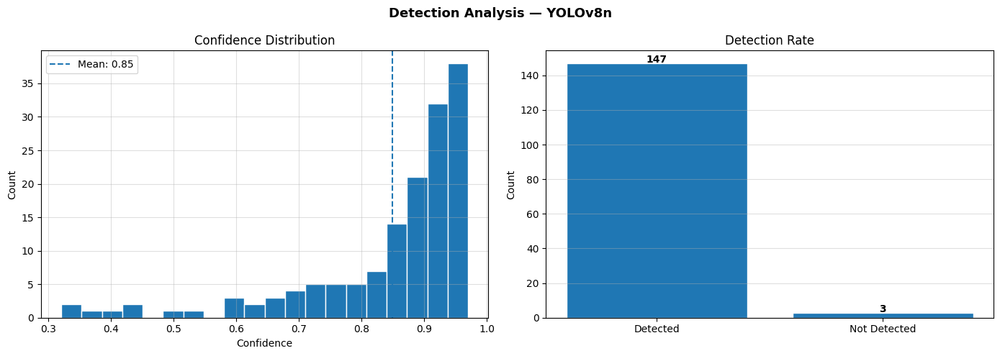

Saved: /kaggle/working/runs/detect/ENDOX_runs/YOLOv8n_confidence_analysis.png

Detection Analysis — YOLO12m
Run: YOLO12m-2
Detected        : 147
Not detected    : 3
Detection rate  : 98.0%
Mean confidence : 0.8240


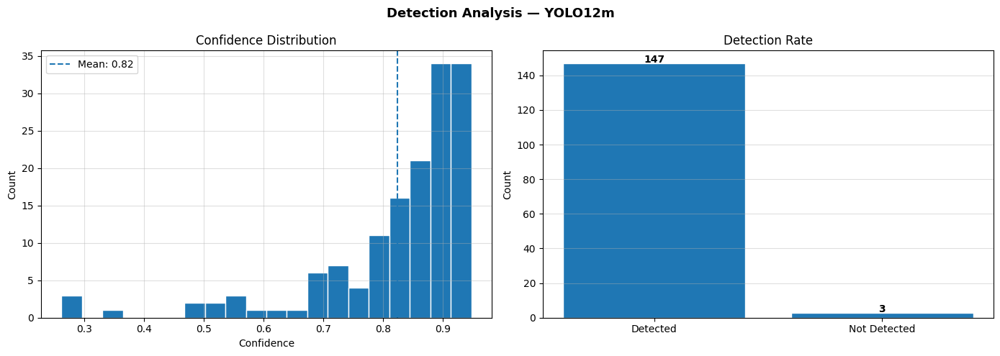

Saved: /kaggle/working/runs/detect/ENDOX_runs/YOLO12m_confidence_analysis.png

Detection Analysis — YOLO26m
Run: YOLO26m-2
Detected        : 142
Not detected    : 8
Detection rate  : 94.7%
Mean confidence : 0.8299


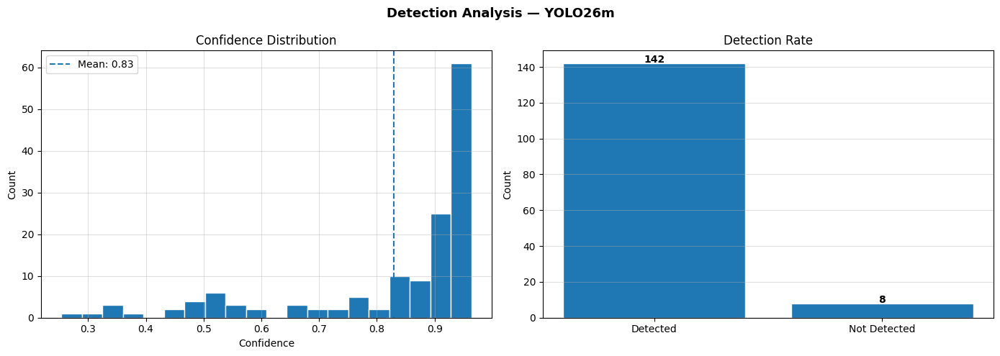

Saved: /kaggle/working/runs/detect/ENDOX_runs/YOLO26m_confidence_analysis.png

CONFIDENCE ANALYSIS SUMMARY


,Model,Run,Detected,Not Detected,Detection Rate,Mean Confidence
0,YOLOv8n,YOLOv8n-3,147,3,98.00%,0.8493
1,YOLO12m,YOLO12m-2,147,3,98.00%,0.8240
2,YOLO26m,YOLO26m-2,142,8,94.67%,0.8299



Saved: /kaggle/working/runs/detect/ENDOX_runs/confidence_analysis_summary.csv


In [30]:
import numpy as np
import os
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO
import torch

RUNS_DIR = Path("/kaggle/working/runs/detect/ENDOX_runs")

SELECTED_RUNS = {
    "YOLOv8n": "YOLOv8n-3",
    "YOLO12m": "YOLO12m-2",
    "YOLO26m": "YOLO26m-2"
}

test_img_dir = Path(BASE) / "images" / "test"

test_files = [
    f for f in os.listdir(test_img_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

confidence_results = []

for model_name, run_name in SELECTED_RUNS.items():

    best_path = (
        RUNS_DIR
        / run_name
        / "weights"
        / "best.pt"
    )

    if not best_path.exists():
        print(f"Skipping {model_name}: best.pt not found")
        continue

    print("\n" + "=" * 70)
    print(f"Detection Analysis — {model_name}")
    print(f"Run: {run_name}")
    print("=" * 70)

    model = YOLO(str(best_path))

    all_confs = []
    detected = 0
    not_detected = 0

    for fname in test_files:

        img_path = test_img_dir / fname

        result = model.predict(
            source=str(img_path),
            conf=CONF_THRESH,
            iou=IOU_THRESH,
            verbose=False
        )[0]

        boxes = result.boxes

        if len(boxes) > 0:

            all_confs.append(
                boxes.conf.max().item()
            )

            detected += 1

        else:

            not_detected += 1

    total_images = detected + not_detected

    detection_rate = (
        detected / total_images * 100
        if total_images > 0
        else 0
    )

    mean_conf = (
        float(np.mean(all_confs))
        if all_confs
        else 0.0
    )

    print(f"Detected        : {detected}")
    print(f"Not detected    : {not_detected}")
    print(f"Detection rate  : {detection_rate:.1f}%")
    print(f"Mean confidence : {mean_conf:.4f}")

    confidence_results.append({
        "Model": model_name,
        "Run": run_name,
        "Detected": detected,
        "Not Detected": not_detected,
        "Detection Rate": detection_rate,
        "Mean Confidence": mean_conf
    })

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(14, 5)
    )

    fig.suptitle(
        f"Detection Analysis — {model_name}",
        fontsize=13,
        fontweight="bold"
    )

    if all_confs:

        axes[0].hist(
            all_confs,
            bins=20,
            edgecolor="white"
        )

        axes[0].axvline(
            mean_conf,
            linestyle="--",
            label=f"Mean: {mean_conf:.2f}"
        )

        axes[0].legend()

    axes[0].set_title(
        "Confidence Distribution"
    )

    axes[0].set_xlabel(
        "Confidence"
    )

    axes[0].set_ylabel(
        "Count"
    )

    axes[0].grid(
        True,
        alpha=0.4
    )

    axes[1].bar(
        ["Detected", "Not Detected"],
        [detected, not_detected],
        edgecolor="white"
    )

    axes[1].set_title(
        "Detection Rate"
    )

    axes[1].set_ylabel(
        "Count"
    )

    axes[1].grid(
        True,
        alpha=0.4,
        axis="y"
    )

    for j, value in enumerate(
        [detected, not_detected]
    ):

        axes[1].text(
            j,
            value + 0.3,
            str(value),
            ha="center",
            fontweight="bold"
        )

    plt.tight_layout()

    output_path = (
        RUNS_DIR /
        f"{model_name}_confidence_analysis.png"
    )

    plt.savefig(
        output_path,
        dpi=150,
        bbox_inches="tight"
    )

    plt.show()

    print(f"Saved: {output_path}")

    del model

    if torch.cuda.is_available():
        torch.cuda.empty_cache()


confidence_df = pd.DataFrame(
    confidence_results
)

print("\n" + "=" * 70)
print("CONFIDENCE ANALYSIS SUMMARY")
print("=" * 70)

display(
    confidence_df.style.format({
        "Detection Rate": "{:.2f}%",
        "Mean Confidence": "{:.4f}"
    })
)

confidence_csv = (
    RUNS_DIR /
    "confidence_analysis_summary.csv"
)

confidence_df.to_csv(
    confidence_csv,
    index=False
)

print(f"\nSaved: {confidence_csv}")

# Save Weights for ENDO-X


In [31]:
from pathlib import Path
import shutil

RUNS_DIR = Path("/kaggle/working/runs/detect/ENDOX_runs")

results_df = results_df.sort_values(
    "mAP50-95",
    ascending=False
).reset_index(drop=True)

best_model_name = results_df.iloc[0]["Model"]

best_weights = (
    RUNS_DIR
    / best_model_name
    / "weights"
    / "best.pt"
)

print("=" * 70)
print("BEST MODEL")
print("=" * 70)

print(f"Model       : {best_model_name}")
print(f"mAP50       : {results_df.iloc[0]['mAP50']:.4f}")
print(f"mAP50-95    : {results_df.iloc[0]['mAP50-95']:.4f}")
print(f"Precision    : {results_df.iloc[0]['Precision']:.4f}")
print(f"Recall      : {results_df.iloc[0]['Recall']:.4f}")
print(f"F1          : {results_df.iloc[0]['F1']:.4f}")
print(f"Weights     : {best_weights}")

if not best_weights.exists():
    raise FileNotFoundError(
        f"Best weights not found: {best_weights}"
    )

output_model = Path(
    "/kaggle/working/endox_polyp_detector.pt"
)

shutil.copy2(
    best_weights,
    output_model
)

print("=" * 70)
print(f"Saved production model: {output_model}")
print("=" * 70)

BEST MODEL
Model       : YOLO12m
mAP50       : 0.8780
mAP50-95    : 0.6764
Precision    : 0.8783
Recall      : 0.9032
F1          : 0.8906
Weights     : /kaggle/working/runs/detect/ENDOX_runs/YOLO12m/weights/best.pt
Saved production model: /kaggle/working/endox_polyp_detector.pt


# Test Single Image

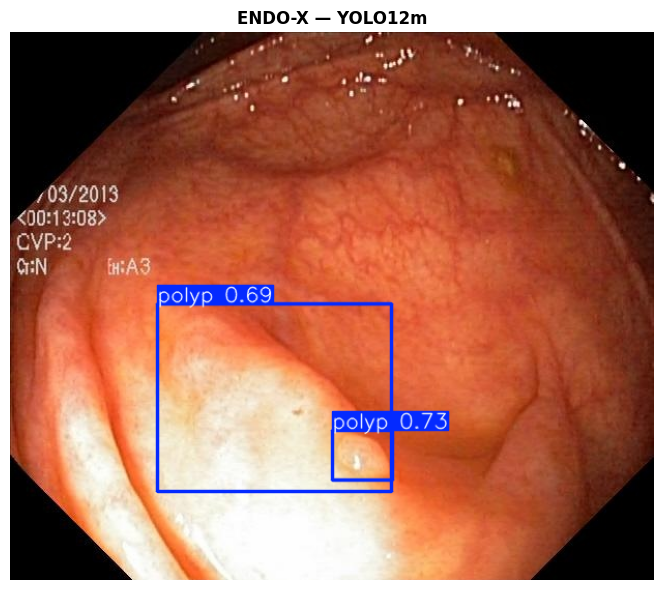

Class      : polyp
Confidence : 0.7344 (73.44%)
Box (xyxy) : x1=311.6 y1=384.8 x2=369.1 y2=433.0
Class      : polyp
Confidence : 0.6908 (69.08%)
Box (xyxy) : x1=142.5 y1=262.8 x2=368.4 y2=443.8


In [34]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

test_img_dir = f"{BASE}/images/test"

best_model_name = results_df.iloc[0]["Model"]

best_weights = (
    RUNS_DIR
    / best_model_name
    / "weights"
    / "best.pt"
)

best_model = YOLO(str(best_weights))

demo_img = os.path.join(
    test_img_dir,
    os.listdir(test_img_dir)[0]
)

result = best_model.predict(
    source=demo_img,
    conf=CONF_THRESH,
    iou=IOU_THRESH,
    verbose=False
)[0]

plotted = result.plot()
plotted = cv2.cvtColor(
    plotted,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(8, 6))
plt.imshow(plotted)

plt.title(
    f"ENDO-X — {best_model_name}",
    fontweight="bold"
)

plt.axis("off")
plt.tight_layout()
plt.show()

boxes = result.boxes

if len(boxes) > 0:

    for box in boxes:

        xyxy = box.xyxy[0].tolist()
        conf = box.conf[0].item()

        print("Class      : polyp")
        print(
            f"Confidence : {conf:.4f} "
            f"({conf * 100:.2f}%)"
        )

        print(
            f"Box (xyxy) : "
            f"x1={xyxy[0]:.1f} "
            f"y1={xyxy[1]:.1f} "
            f"x2={xyxy[2]:.1f} "
            f"y2={xyxy[3]:.1f}"
        )

else:

    print("No polyp detected.")

In [35]:
import os
import shutil
from pathlib import Path

RUNS_DIR = Path("/kaggle/working/runs/detect/ENDOX_runs")
BACKUP_DIR = Path("/kaggle/working/ENDOX_final_results")
ZIP_PATH = Path("/kaggle/working/ENDOX_final_results.zip")

if BACKUP_DIR.exists():
    shutil.rmtree(BACKUP_DIR)

if ZIP_PATH.exists():
    ZIP_PATH.unlink()

BACKUP_DIR.mkdir(parents=True, exist_ok=True)

print("=" * 70)
print("COLLECTING ENDO-X YOLO RESULTS")
print("=" * 70)

if RUNS_DIR.exists():

    shutil.copytree(
        RUNS_DIR,
        BACKUP_DIR / "training_runs",
        dirs_exist_ok=True
    )

    print("✓ All training runs copied")

else:

    print(f"⚠ Training directory not found: {RUNS_DIR}")

if "results_df" in globals():

    results_df.to_csv(
        BACKUP_DIR / "final_model_comparison.csv",
        index=False
    )

    print("✓ final_model_comparison.csv saved")

curve_files = list(
    RUNS_DIR.rglob("*training_curves*.png")
) if RUNS_DIR.exists() else []

for file in curve_files:

    destination = (
        BACKUP_DIR
        / "graphs"
        / file.name
    )

    destination.parent.mkdir(
        parents=True,
        exist_ok=True
    )

    shutil.copy2(
        file,
        destination
    )

print(f"✓ Training curves copied: {len(curve_files)}")

prediction_files = []

if RUNS_DIR.exists():

    prediction_files = list(
        RUNS_DIR.rglob("*test_predictions*.png")
    )

for file in prediction_files:

    destination = (
        BACKUP_DIR
        / "predictions"
        / file.name
    )

    destination.parent.mkdir(
        parents=True,
        exist_ok=True
    )

    shutil.copy2(
        file,
        destination
    )

print(
    f"✓ Test prediction figures copied: "
    f"{len(prediction_files)}"
)

root_analysis_files = [
    "confidence_analysis.png",
    "test_predictions.png"
]

analysis_count = 0

for file_name in root_analysis_files:

    possible_paths = [
        Path("/kaggle/working") / file_name,
        Path.cwd() / file_name
    ]

    for source in possible_paths:

        if source.exists():

            destination = (
                BACKUP_DIR
                / "analysis"
                / file_name
            )

            destination.parent.mkdir(
                parents=True,
                exist_ok=True
            )

            shutil.copy2(
                source,
                destination
            )

            analysis_count += 1
            break

print(
    f"✓ Additional analysis figures copied: "
    f"{analysis_count}"
)

if "yaml_path" in globals():

    yaml_source = Path(yaml_path)

    if yaml_source.exists():

        shutil.copy2(
            yaml_source,
            BACKUP_DIR / "kvasir_detection.yaml"
        )

        print("✓ Dataset YAML copied")

if "best_model_name" in globals():

    best_weights = (
        RUNS_DIR
        / best_model_name
        / "weights"
        / "best.pt"
    )

    if best_weights.exists():

        shutil.copy2(
            best_weights,
            BACKUP_DIR / "endox_polyp_detector.pt"
        )

        print(
            f"✓ Production model copied: "
            f"{best_model_name}"
        )

    else:

        print(
            f"⚠ Best weights not found: "
            f"{best_weights}"
        )

else:

    print("⚠ best_model_name not found")

if "MODELS" in globals():

    with open(
        BACKUP_DIR / "models_used.txt",
        "w"
    ) as f:

        for name, weights in MODELS.items():

            f.write(
                f"{name}: {weights}\n"
            )

    print("✓ models_used.txt saved")

config_variables = [
    "EPOCHS",
    "IMG_SIZE",
    "BATCH_SIZE",
    "LR0",
    "LRF",
    "PATIENCE",
    "CONF_THRESH",
    "IOU_THRESH",
    "SEED"
]

config = {}

for variable in config_variables:

    if variable in globals():

        config[variable] = globals()[variable]

with open(
    BACKUP_DIR / "training_config.txt",
    "w"
) as f:

    for key, value in config.items():

        f.write(
            f"{key} = {value}\n"
        )

print("✓ training_config.txt saved")

with open(
    BACKUP_DIR / "README.txt",
    "w"
) as f:

    f.write(
"""ENDO-X — YOLO Polyp Detection Experiments

Dataset:
Kvasir-SEG

Task:
Polyp Object Detection

Classes:
1 — polyp

Experiments:
Multiple YOLO architectures were trained and evaluated.

Contents
--------

training_runs/
    Complete Ultralytics training outputs for all experiments.

final_model_comparison.csv
    Final test-set comparison of trained models.

graphs/
    Training curves generated for the experiments.

predictions/
    Test-set prediction visualizations for each model.

analysis/
    Confidence and detection analysis figures.

kvasir_detection.yaml
    YOLO dataset configuration.

endox_polyp_detector.pt
    Selected production detector checkpoint.

models_used.txt
    Models and pretrained weights used.

training_config.txt
    Main training configuration.

Production Model
----------------
The production model is selected according to the
model-selection procedure used in the experiment.

Backend Location
----------------
Copy:

endox_polyp_detector.pt

to:

models/detector/endox_polyp_detector.pt

Important
---------
The test set is used for final model evaluation.
"""
    )

print("✓ README.txt saved")

print("\n" + "=" * 70)
print("FILES INCLUDED")
print("=" * 70)

file_count = 0
total_size = 0

for path in sorted(BACKUP_DIR.rglob("*")):

    if path.is_file():

        size_mb = path.stat().st_size / (1024 ** 2)
        total_size += size_mb
        file_count += 1

        print(
            f"{path.relative_to(BACKUP_DIR)} "
            f"({size_mb:.2f} MB)"
        )

print("\n" + "=" * 70)
print("CREATING ZIP")
print("=" * 70)

shutil.make_archive(
    str(ZIP_PATH.with_suffix("")),
    "zip",
    BACKUP_DIR
)

zip_size = ZIP_PATH.stat().st_size / (1024 ** 2)

print("\n" + "=" * 70)
print("DONE")
print("=" * 70)

print(f"Files collected : {file_count}")
print(f"Folder size     : {total_size:.2f} MB")
print(f"ZIP size        : {zip_size:.2f} MB")
print(f"ZIP location    : {ZIP_PATH}")

print("\n✓ ENDO-X YOLO results are ready.")
print("Download the ZIP from the Kaggle /kaggle/working file browser.")

COLLECTING ENDO-X YOLO RESULTS
✓ All training runs copied
✓ final_model_comparison.csv saved
✓ Training curves copied: 3
✓ Test prediction figures copied: 3
✓ Additional analysis figures copied: 0
✓ Dataset YAML copied
✓ Production model copied: YOLO12m
✓ models_used.txt saved
✓ training_config.txt saved
✓ README.txt saved

FILES INCLUDED
README.txt (0.00 MB)
endox_polyp_detector.pt (38.88 MB)
final_model_comparison.csv (0.00 MB)
graphs/YOLO12m_training_curves.png (0.24 MB)
graphs/YOLO26m_training_curves.png (0.29 MB)
graphs/YOLOv8n_training_curves.png (0.31 MB)
kvasir_detection.yaml (0.00 MB)
models_used.txt (0.00 MB)
predictions/YOLO12m_test_predictions.png (3.55 MB)
predictions/YOLO26m_test_predictions.png (3.55 MB)
predictions/YOLOv8n_test_predictions.png (3.55 MB)
training_config.txt (0.00 MB)
training_runs/YOLO12m/BoxF1_curve.png (0.11 MB)
training_runs/YOLO12m/BoxPR_curve.png (0.08 MB)
training_runs/YOLO12m/BoxP_curve.png (0.10 MB)
training_runs/YOLO12m/BoxR_curve.png (0.10 MB)
